In [2]:
import numpy as np 
import bokeh
import pandas as pd 
import geopandas as gpd 
from shapely.geometry import Point, Polygon
import json

from bokeh.io import curdoc, output_notebook
from bokeh.models import Slider, HoverTool
from bokeh.layouts import widgetbox, row, column

from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer
from bokeh.plotting import ColumnDataSource, figure, output_file, show


from shapely.geometry import Point, Polygon



ModuleNotFoundError: No module named 'bokeh'

In [2]:
shapefile = '../data/syr_admin_json_190321.json'

gdf = gpd.read_file(shapefile)
gdf['id'] = gdf.index
gdf.set_index('id', drop=True, inplace=True)
gdf.head()


,NAME_EN,NAM_EN_REF,NAME_AR,NAM_AR_REF,PCODE,ADM2_EN,ADM2_AR,ADM2_PCODE,ADM1_EN,ADM1_AR,ADM1_PCODE,ADM0_EN,ADM0_AR,ADM0_PCODE,UPDATE_DAT,geometry
id,,,,,,,,,,,,,,,,
0,Damascus,Damascus,دمشق,دمشق,SY010000,Damascus,دمشق,SY0100,Damascus,دمشق,SY01,الجمهورية العربية السورية,Syrian Arab Republic,SY,2016-09-05,"POLYGON ((36.22584 33.54541, 36.22584 33.54543..."
1,Jebel Saman,Jebel Saman,مركز جبل سمعان,مركز جبل سمعان,SY020000,Jebel Saman,جبل سمعان,SY0200,Aleppo,حلب,SY02,الجمهورية العربية السورية,Syrian Arab Republic,SY,2016-09-05,"POLYGON ((37.30098 36.17088, 37.29060 36.16130..."
2,Atareb,Atareb,أتارب,أتارب,SY020001,Jebel Saman,جبل سمعان,SY0200,Aleppo,حلب,SY02,الجمهورية العربية السورية,Syrian Arab Republic,SY,2016-09-05,"POLYGON ((36.81647 36.21566, 36.83002 36.19746..."
3,Tall Ed-daman,Tall Ed-daman,تل الضمان,تل الضمان,SY020002,Jebel Saman,جبل سمعان,SY0200,Aleppo,حلب,SY02,الجمهورية العربية السورية,Syrian Arab Republic,SY,2016-09-05,"POLYGON ((37.31998 35.86524, 37.31890 35.86301..."
4,Haritan,Haritan,حريتان,حريتان,SY020003,Jebel Saman,جبل سمعان,SY0200,Aleppo,حلب,SY02,الجمهورية العربية السورية,Syrian Arab Republic,SY,2016-09-05,"POLYGON ((37.32261 36.36237, 37.31826 36.35573..."


In [3]:
df = pd.read_csv('../data/syrian_war.csv')
df.head()

,Unnamed: 0,data_id,event_date,year,time_precision,event_type,sub_event_type,actor1,inter1,interaction,location,latitude,longitude,geo_precision,source,fatalities,timestamp,region_id
0,0,7071632,25 April 2020,2020,3,2,4,0,7,37,Ras Al Ain,36.8494,40.0747,2,SHAM,1,1588021902,184
1,1,7071641,25 April 2020,2020,1,0,2,4,2,22,Tal Tamer,36.6534,40.3718,2,SHAM,2,1588021902,171
2,2,7071661,25 April 2020,2020,1,1,0,4,2,22,Basira,35.1580,40.4277,2,SOHR,0,1588021902,188
3,3,7071675,25 April 2020,2020,1,1,0,42,2,22,Al Bab,36.3697,37.5149,1,SOHR,0,1588021902,8
4,4,7071677,25 April 2020,2020,1,1,0,5,2,23,Idleb,35.9290,36.6353,1,SOHR,1,1588021902,144


In [4]:
ngdf = gdf.drop(['NAM_EN_REF', 'NAM_AR_REF',  'PCODE', 'ADM2_EN',
       'ADM2_AR', 'ADM2_PCODE', 'ADM1_EN', 'ADM1_AR', 'ADM1_PCODE', 'ADM0_EN',
       'ADM0_AR', 'ADM0_PCODE', 'UPDATE_DAT'], axis=1)

In [5]:
ngdf.head()

,NAME_EN,NAME_AR,geometry
id,,,
0,Damascus,دمشق,"POLYGON ((36.22584 33.54541, 36.22584 33.54543..."
1,Jebel Saman,مركز جبل سمعان,"POLYGON ((37.30098 36.17088, 37.29060 36.16130..."
2,Atareb,أتارب,"POLYGON ((36.81647 36.21566, 36.83002 36.19746..."
3,Tall Ed-daman,تل الضمان,"POLYGON ((37.31998 35.86524, 37.31890 35.86301..."
4,Haritan,حريتان,"POLYGON ((37.32261 36.36237, 37.31826 36.35573..."


In [6]:
ngdf['fatalities'] = ngdf.apply(lambda row:np.sum(df[df['region_id']==row.name]['fatalities']), axis=1)
ngdf.head()

,NAME_EN,NAME_AR,geometry,fatalities
id,,,,
0,Damascus,دمشق,"POLYGON ((36.22584 33.54541, 36.22584 33.54543...",3408
1,Jebel Saman,مركز جبل سمعان,"POLYGON ((37.30098 36.17088, 37.29060 36.16130...",2611
2,Atareb,أتارب,"POLYGON ((36.81647 36.21566, 36.83002 36.19746...",764
3,Tall Ed-daman,تل الضمان,"POLYGON ((37.31998 35.86524, 37.31890 35.86301...",129
4,Haritan,حريتان,"POLYGON ((37.32261 36.36237, 37.31826 36.35573...",209


In [16]:
centers = list(ngdf.apply(lambda row: Polygon(row['geometry']).centroid, axis=1))

In [21]:
ngdf['center_x'] = [c.x for c in centers]
ngdf['center_y'] = [c.y for c in centers]

In [27]:
ngdf.head()

,NAME_EN,NAME_AR,geometry,fatalities,center_x,center_y
id,,,,,,
0,Damascus,دمشق,"POLYGON ((36.22584 33.54541, 36.22584 33.54543...",3408,36.278083,33.515686
1,Jebel Saman,مركز جبل سمعان,"POLYGON ((37.30098 36.17088, 37.29060 36.16130...",2611,37.157503,36.187274
2,Atareb,أتارب,"POLYGON ((36.81647 36.21566, 36.83002 36.19746...",764,36.857684,36.129219
3,Tall Ed-daman,تل الضمان,"POLYGON ((37.31998 35.86524, 37.31890 35.86301...",129,37.236208,35.755745
4,Haritan,حريتان,"POLYGON ((37.32261 36.36237, 37.31826 36.35573...",209,37.180776,36.279079


In [7]:
np.max(ngdf['fatalities']),np.mean(ngdf['fatalities'])

(7920, 497.56617647058823)

<AxesSubplot:>

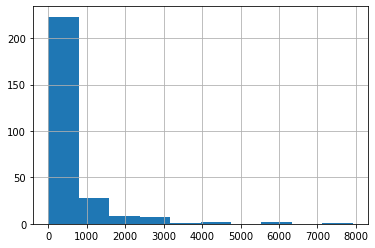

In [8]:
ngdf['fatalities'].hist()

In [31]:
json_data = ngdf.to_json()

In [33]:
geosource = GeoJSONDataSource(geojson = json_data)

In [55]:
palette = brewer['YlGnBu'][8][::-1]

In [58]:
max_value = np.max(ngdf['fatalities'])
color_mapper = LinearColorMapper(palette=palette, low=0, high=max_value)

tick_labels = {f'{i}': f'{i}' for i in range(0,max_value,1000)}

color_bar = ColorBar(color_mapper=color_mapper,
                     label_standoff=8,
                     width = 500, height = 20,
                     border_line_color=None,
                     location = (0,0),
                     orientation = 'horizontal',
                     major_label_overrides = tick_labels)

p = figure(title = 'Syria Map', plot_height = 1000 , plot_width = 1000, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

p.patches(source = geosource,
          fill_color = {'field' :'fatalities', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 0.8)

p.add_layout(color_bar, 'below')

output_notebook()

show(p)



Loading BokehJS ...

In [46]:
ngdf[['NAME_EN','fatalities','center_x', 'center_y']].head()

,NAME_EN,fatalities,center_x,center_y
id,,,,
0,Damascus,3408,36.278083,33.515686
1,Jebel Saman,2611,37.157503,36.187274
2,Atareb,764,36.857684,36.129219
3,Tall Ed-daman,129,37.236208,35.755745
4,Haritan,209,37.180776,36.279079


In [61]:
max_value = np.max(ngdf['fatalities'])
color_mapper = LinearColorMapper(palette=palette, low=0, high=max_value)

TOOLTIPS = [
    ("region", "@NAME_EN"),
    ("fatalities", "@fatalities"),
]

tick_labels = {f'{i}': f'{i}' for i in range(0, max_value, 1000)}

color_bar = ColorBar(color_mapper=color_mapper,
                     label_standoff=8,
                     width = 500, height = 20,
                     border_line_color=None,
                     location = (0,0),
                     orientation = 'horizontal',
                     major_label_overrides = tick_labels)

p = figure(title = 'Syria Map', plot_height=800 , plot_width=800, tooltips=TOOLTIPS)

p.patches(source=geosource,
          fill_color={'field' : 'fatalities', 'transform' : color_mapper},
          line_color='black', line_width=0.25, fill_alpha=0.8)

p.add_layout(color_bar, 'below')

output_notebook()

show(p)

Loading BokehJS ...